**Problem Statement**

In this Notebook I'm going to predict the diabetes of a person whether he/she have daibetes or not using the Kaggle dataset. The three machine learning algorithm I'm going to use are Logistic regression,Random Forest and XGBCalssifier.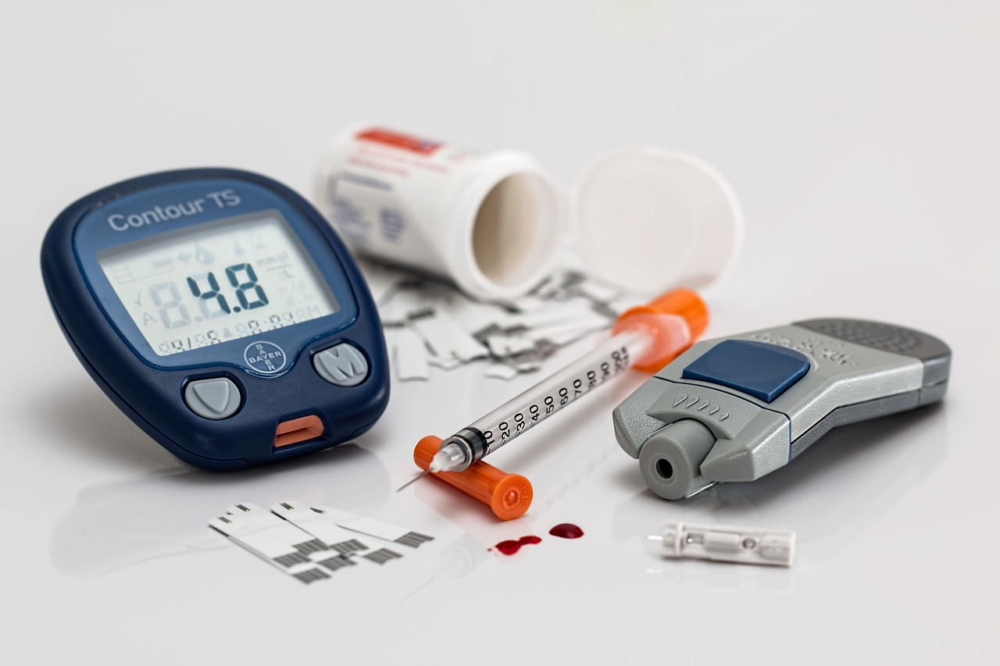



---


Link: https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset

About Dataset :



1.Diabetes_binary represents :0 = no diabetes 1 = prediabetes 2 = diabetes
2.HighBP represents 0 = no high BP 1 = high BP
3.HighChol : 0 = no high cholesterol 1 = high cholesterol
4.CholCheck :0 = no cholesterol check in 5 years 1 = yes cholesterol check in 5 years
5.BMI : Body Mass Index
6.Smoker :Have you smoked at least 100 cigarettes in your entire life? [Note: 5 packs = 100 cigarettes] 0 = no 1 = yes
7.Stroke :(Ever told) you had a stroke. 0 = no 1 = yes
8.HeartDiseaseorAttack: coronary heart disease (CHD) or myocardial infarction (MI) 0 = no 1 = yes
9.PhysActivity : physical activity in past 30 days - not including job 0 = no 1 = yes
10.Fruits :Consume Fruit 1 or more times per day 0 = no 1 = yes
11.Veggies : Consume Vegetables 1 or more times per day 0 = no 1 = yes
12.HvyAlcoholConsump : Heavy drinkers (adult men having more than 14 drinks per week and adult women having more than 7 drinks per week) 0 = no
13.AnyHealthcare : Have any kind of health care coverage, including health insurance, prepaid plans such as HMO, etc. 0 = no 1 = yes
14.NoDocbcCost: Was there a time in the past 12 months when you needed to see a doctor but could not because of cost? 0 = no 1 = yes
15.GenHlth : Would you say that in general your health is: scale 1-5 1 = excellent 2 = very good 3 = good 4 = fair 5 = poor
16.MentHlth : Now thinking about your mental health, which includes stress, depression, and problems with emotions, for how
17.PhysHlth : Now thinking about your physical health, which includes physical illness and injury, for how many days during the past 30
18.DiffWalk : Do you have serious difficulty walking or climbing stairs? 0 = no 1 = yes
19.Sex : 0 = female 1 = male
20.Age : 13-level age category (_AGEG5YR see codebook) 1 = 18-24 9 = 60-64 13 = 80 or older
21.Education : Education level (EDUCA see codebook) scale 1-6 1 = Never attended school or only kindergarten 2 = Grades 1 through 8
22.Income : Income scale (INCOME2 see codebook) scale 1-8 1 = less than $10,000 5 = less than $35,000 8 = $75,000 or more

Let's predict diabetes of person based on above features.



Downloading The Data :

In [261]:
!pip install opendatasets --upgrade --quiet

In [262]:
import opendatasets as od

In [263]:
od.version()

'0.1.22'

In [264]:
dataset_url='https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset'

In [265]:
 od.download(dataset_url)

Skipping, found downloaded files in "./diabetes-health-indicators-dataset" (use force=True to force download)


In [266]:
import os

In [267]:
data_dir = './diabetes-health-indicators-dataset'

In [268]:
os.listdir(data_dir)

['diabetes_012_health_indicators_BRFSS2015.csv',
 'diabetes_binary_5050split_health_indicators_BRFSS2015.csv',
 'diabetes_binary_health_indicators_BRFSS2015.csv']

In [269]:
train_csv=data_dir + '/diabetes_binary_health_indicators_BRFSS2015.csv'

## The Data & EDA :


In [270]:
#Importing Basic Liblaries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn

In [271]:
raw_df=pd.read_csv(train_csv)

In [272]:
raw_df.head(10)

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0
5,0.0,1.0,1.0,1.0,25.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,2.0,0.0,1.0,10.0,6.0,8.0
6,0.0,1.0,0.0,1.0,30.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,3.0,0.0,14.0,0.0,0.0,9.0,6.0,7.0
7,0.0,1.0,1.0,1.0,25.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,3.0,0.0,0.0,1.0,0.0,11.0,4.0,4.0
8,1.0,1.0,1.0,1.0,30.0,1.0,0.0,1.0,0.0,1.0,...,1.0,0.0,5.0,30.0,30.0,1.0,0.0,9.0,5.0,1.0
9,0.0,0.0,0.0,1.0,24.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,2.0,0.0,0.0,0.0,1.0,8.0,4.0,3.0


In [273]:
raw_df.columns

Index(['Diabetes_binary', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

In [274]:
#Checking The Null Values
raw_df.isna().sum()

Diabetes_binary         0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64

From above, it is clear that In our data there is no Na or Null Values

In [275]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_binary       253680 non-null  float64
 1   HighBP                253680 non-null  float64
 2   HighChol              253680 non-null  float64
 3   CholCheck             253680 non-null  float64
 4   BMI                   253680 non-null  float64
 5   Smoker                253680 non-null  float64
 6   Stroke                253680 non-null  float64
 7   HeartDiseaseorAttack  253680 non-null  float64
 8   PhysActivity          253680 non-null  float64
 9   Fruits                253680 non-null  float64
 10  Veggies               253680 non-null  float64
 11  HvyAlcoholConsump     253680 non-null  float64
 12  AnyHealthcare         253680 non-null  float64
 13  NoDocbcCost           253680 non-null  float64
 14  GenHlth               253680 non-null  float64
 15  

From above info we see that our data sets contains total 22 columns whose data types are float64

In [276]:
raw_df.sample(20)

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
212864,0.0,1.0,1.0,1.0,41.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,2.0,0.0,0.0,0.0,1.0,4.0,4.0,7.0
234002,0.0,0.0,0.0,1.0,31.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,3.0,0.0,0.0,0.0,0.0,9.0,6.0,8.0
241338,0.0,0.0,0.0,0.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,5.0,0.0,1.0,1.0,6.0,8.0
239860,0.0,0.0,0.0,1.0,24.0,0.0,1.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,8.0,4.0,8.0
6059,0.0,1.0,1.0,1.0,41.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,3.0,15.0,4.0,0.0,1.0,6.0,4.0,2.0
151836,1.0,0.0,0.0,1.0,24.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,10.0,15.0,1.0,0.0,6.0,5.0,4.0
131818,0.0,1.0,1.0,1.0,29.0,1.0,1.0,1.0,1.0,0.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,13.0,2.0,8.0
27806,0.0,0.0,0.0,1.0,31.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,3.0,3.0,0.0,0.0,0.0,3.0,6.0,8.0
74623,0.0,1.0,1.0,1.0,53.0,1.0,0.0,1.0,1.0,1.0,...,1.0,1.0,3.0,0.0,1.0,1.0,1.0,9.0,5.0,6.0
41603,0.0,1.0,1.0,1.0,25.0,1.0,1.0,1.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,0.0,10.0,6.0,5.0


In [277]:
raw_df.nunique()

Diabetes_binary          2
HighBP                   2
HighChol                 2
CholCheck                2
BMI                     84
Smoker                   2
Stroke                   2
HeartDiseaseorAttack     2
PhysActivity             2
Fruits                   2
Veggies                  2
HvyAlcoholConsump        2
AnyHealthcare            2
NoDocbcCost              2
GenHlth                  5
MentHlth                31
PhysHlth                31
DiffWalk                 2
Sex                      2
Age                     13
Education                6
Income                   8
dtype: int64

From above came to know that there 84 different values for BMI,5 for GenHlth,31 for Mental Health and Physical Health, 13 for age, 6 for education, 8 for Income and the rest columns have Binary values 1 or 0.

In [278]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [279]:
raw_df.shape

(253680, 22)

Diabetes Dataset Have 2 lakhs 53 thousands six hundreds and eighty rows and 22 columns.

In [280]:
import plotly.express as px
sns.set_style('darkgrid')
matplotlib.rcParams['font.size']=12
matplotlib.rcParams['figure.figsize']=(12,8)
matplotlib.rcParams['figure.facecolor']='#00000000'

In [281]:
px.histogram(raw_df,x='Age',title='Age Vs Diabetes', color='Diabetes_binary')

From above Graph, we can conclude that we have more data for 6 to 11 groups of ages and also these people are more effected with a Diabetes. So Age is going to be one the crucial feature in our predictions.

In [282]:
raw_df.Age.max()

13.0

In [283]:
px.histogram(raw_df, x='Diabetes_binary', color='Sex', title='Diabetes Sex Wise Distribution')

From the above plot, we see the Gender Wise distribution of Diabetes.

In [284]:
px.histogram(raw_df,
             x='BMI',
             title='Relation Between BMI & Diabetes',
             color='Diabetes_binary')

From above histogram, we can conclude that people having BMI from 18 to 21 are safe as compared to the people having more BMI i.e. above 22.

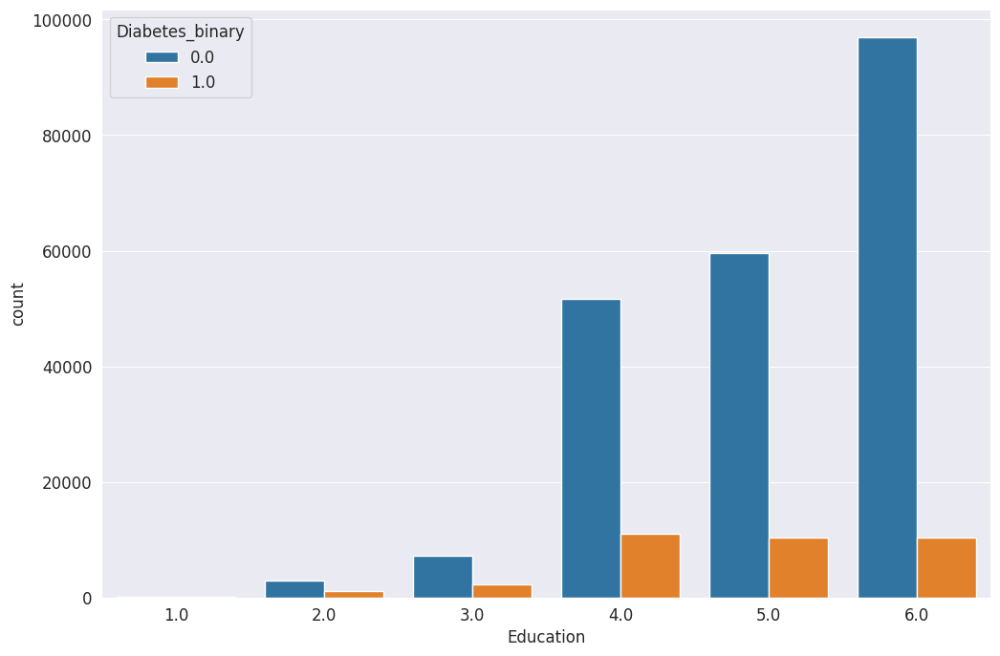

In [285]:
sns.countplot(x='Education',hue="Diabetes_binary",data=raw_df);

 From Above Graph,Specially seeing the last three bars we Can Conclude that Education Doesn't effect Diabetes beacuse with increase in counts the diabetes persons counts remains constant.

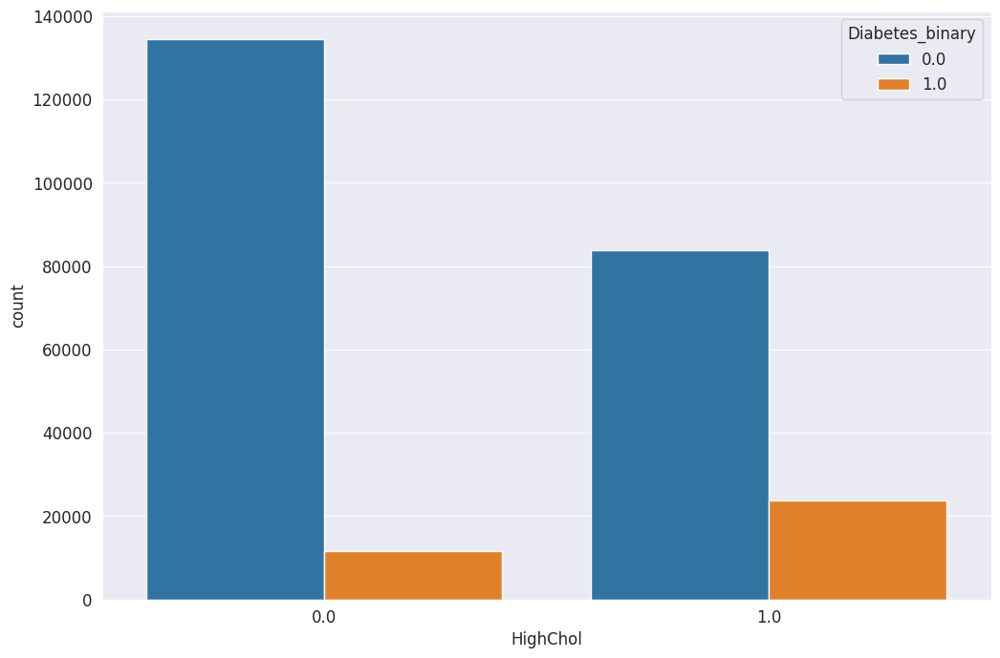

In [286]:
sns.countplot(x='HighChol',hue='Diabetes_binary',data=raw_df);

From above catplot, we can see that High Cholestral is effecting effecting the diabetes. People with highchol have more chnace of getting a diabtets.

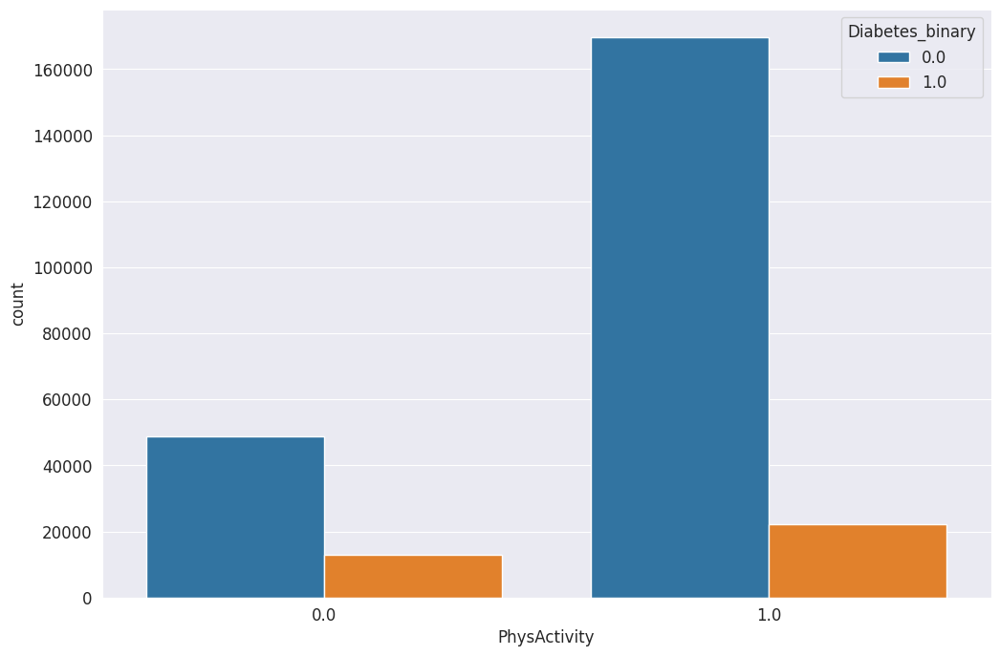

In [287]:
sns.countplot(x='PhysActivity',hue='Diabetes_binary',data=raw_df);

From above plot, we see that people not doing Physical Activity have more diabetes as compared to people doing Physical Activity even though we have less data for not doing PhysActvity as compared to Doing PhysActivity.

In [288]:
px.histogram(raw_df,
             x='DiffWalk',
             title='Relation Between Walk & Diabetes',
             color='Diabetes_binary')

From Above Graph, we can see that people who have difficulty while walking have more chances of diabetes.



In [289]:
px.violin(raw_df,
             x='MentHlth',
             y='PhysHlth',
             title='MentHlth Vs PhysHlth',
             color='Diabetes_binary')

From above violin plot we can say that Mental health doesn't much effect on diabetes while the physical health have considerable effect on the diabetes.

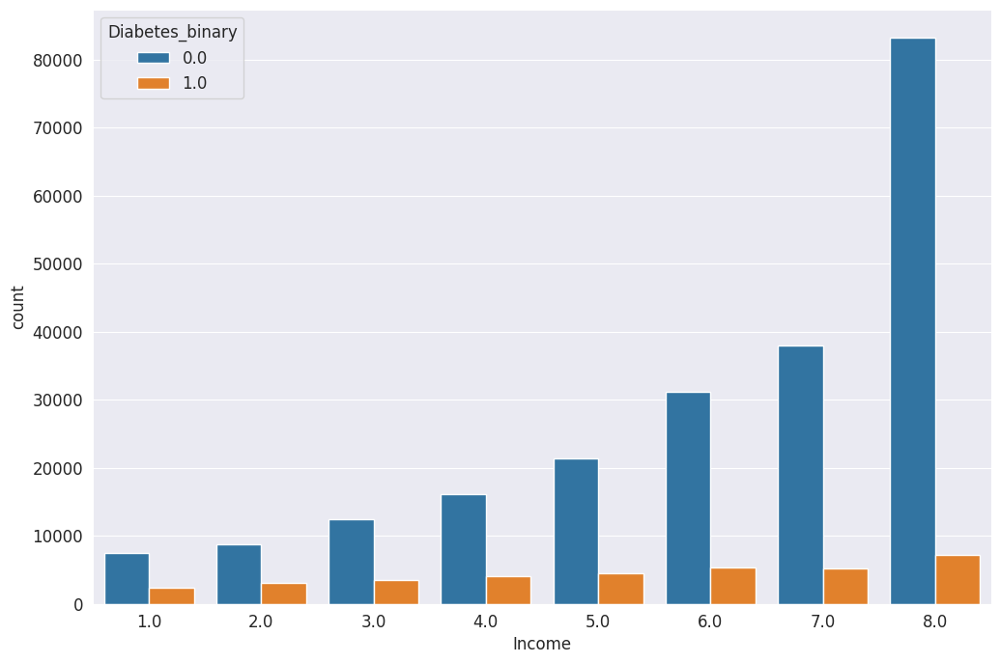

In [290]:
sns.countplot(x='Income',hue='Diabetes_binary',data=raw_df);

From above count plot, it is clear that income doesn't have an effect on diabetes beacuse with increase in income diabetes doesn't increases by a considrable amount.

In [291]:
px.histogram(raw_df,
             x='HighChol',
             color='Diabetes_binary',
             title='HighChol Vs Diabetes')

People having highChol have a high chances of diabetes.

In [292]:
px.histogram(raw_df,
             x='HighBP',
             color='Diabetes_binary',
             title='HighBP Vs Diabetes')

From above Graph, It becomses clear that people having high Blood pressures have more diabetes as compared to the people without High BP.

In [293]:
px.histogram(raw_df,
             x='CholCheck',
             color='Diabetes_binary',
             title='CholChecek Vs Diabetes')

From above Graph, there may be chances that Cholestral Check Up indiactes the Diabetes.

In [294]:
px.histogram(raw_df,
             x='Smoker',
             color='Diabetes_binary',
             title='Smoker Vs Diabetes')

From above plot, we can say that people who smoke has more chances of diabetes as compared to those who don't smoke.

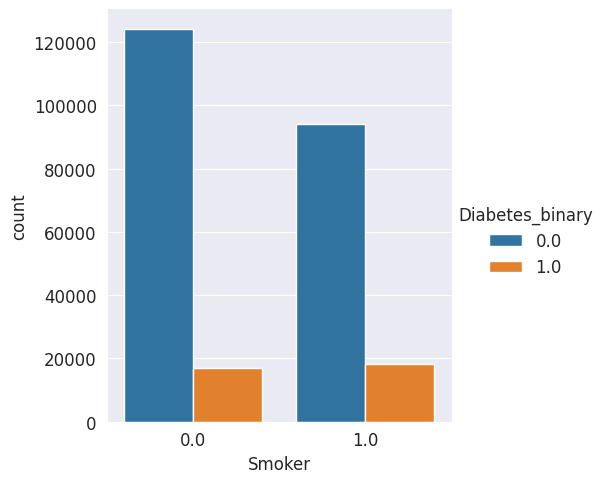

In [295]:
sns.catplot(x="Smoker",hue='Diabetes_binary',data=raw_df,kind='count');

From above plot, we can say that people who smoke has more chances of diabetes as compared to those who don't smoke. This graphs make our sentence more clear.

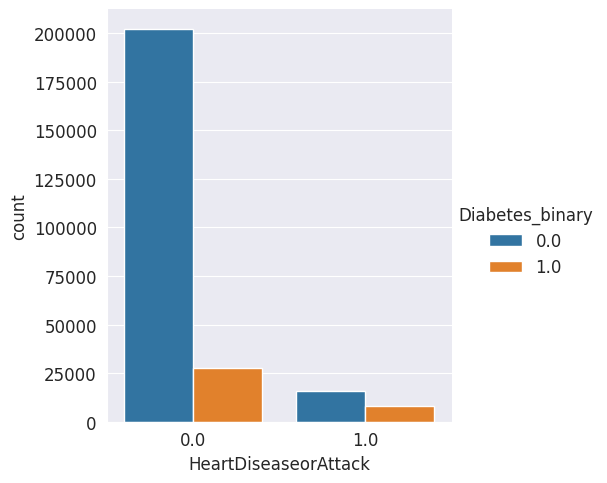

In [296]:
sns.catplot(x='HeartDiseaseorAttack',hue='Diabetes_binary',data=raw_df,kind='count');

From above plot, we can say HeartDisease Have some influece on Diabetes.

Text(0, 0.5, 'Count')

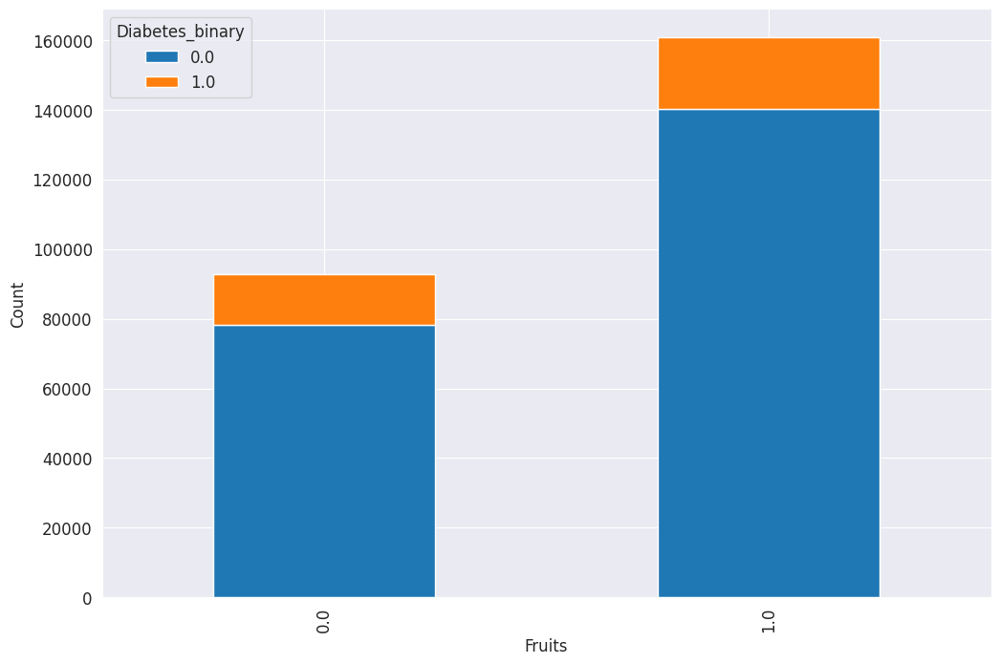

In [297]:
pd.crosstab(raw_df['Fruits'],raw_df['Diabetes_binary']).plot.bar(stacked=True);
plt.ylabel('Count')

From above plot, we canconclude that people who eats fruits have less diabetes as compared to those who don't eat fruits.

Text(0, 0.5, 'Count')

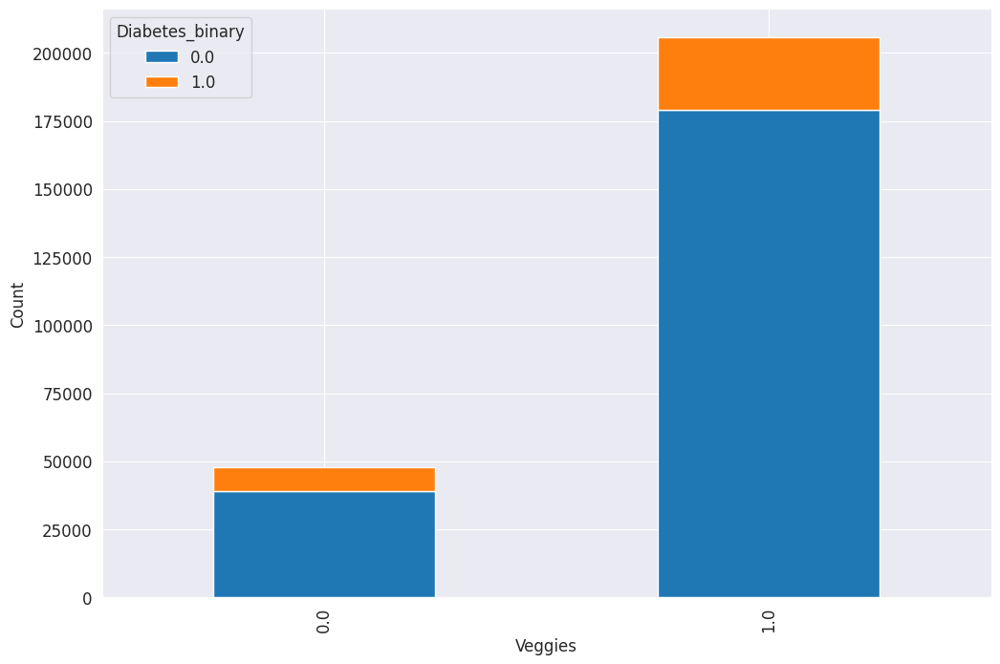

In [298]:
pd.crosstab(raw_df['Veggies'],raw_df['Diabetes_binary']).plot.bar(stacked=True);
plt.ylabel('Count')

From above plot, we canconclude that people who have vegetables fruits have less diabetes as compared to those who don't eat vegetables.

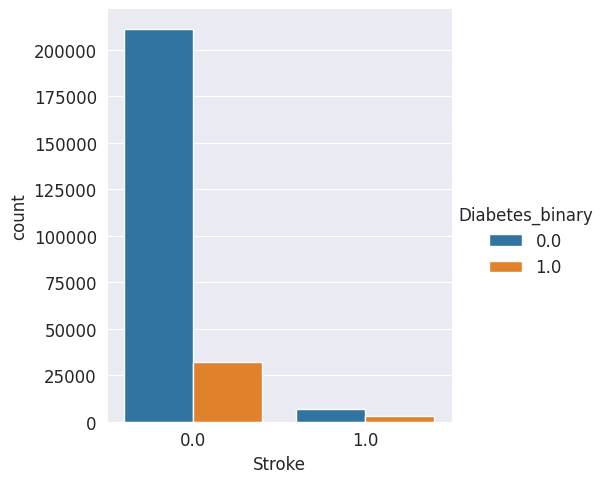

In [299]:
sns.catplot(x="Stroke",hue='Diabetes_binary',data=raw_df,kind='count');

Observation : People having stroke have more diabetes as compared to people    without stroke.

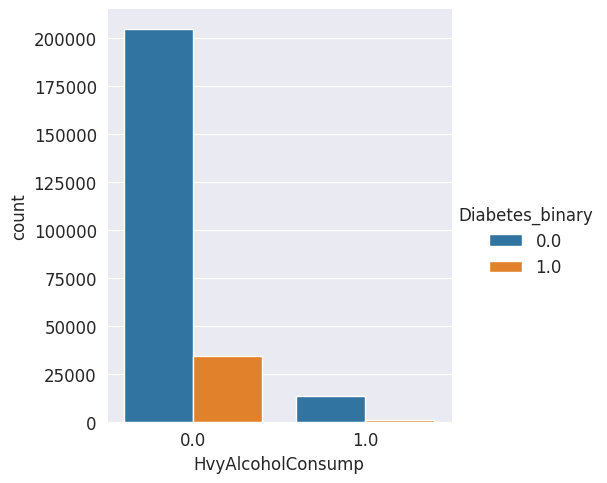

In [300]:
sns.catplot(x="HvyAlcoholConsump",hue='Diabetes_binary',data=raw_df,kind='count');

From above we can canclude that person having Heavy Alcohol Consumption have more chances odf diabetes.

Text(0, 0.5, 'Count')

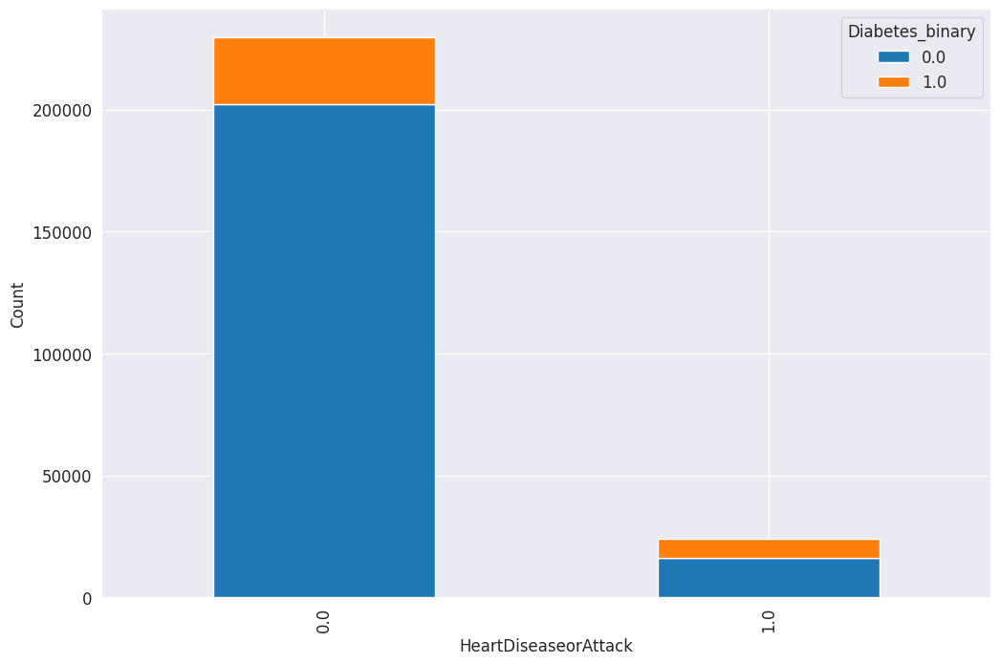

In [302]:
pd.crosstab(raw_df['HeartDiseaseorAttack'],raw_df['Diabetes_binary']).plot.bar(stacked=True);
plt.ylabel('Count')

From above Graph, we can say that Hearth Disease have huge effect on Diabetes, beacuse we have less data for yes heart disease but in that have more diabetes person's count.

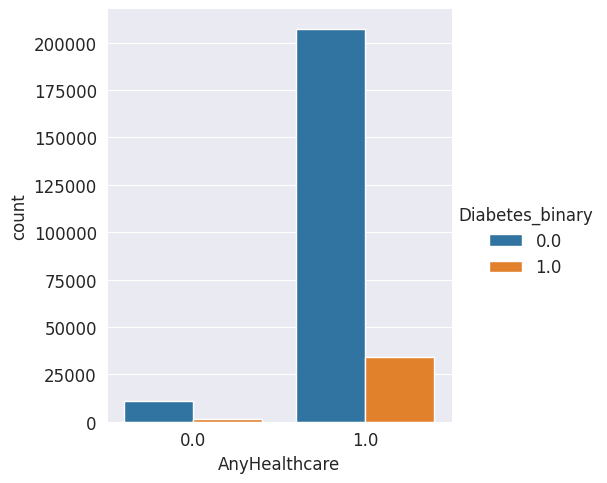

In [303]:
sns.catplot(x="AnyHealthcare",hue='Diabetes_binary',data=raw_df,kind='count');

From above graph, we can conclude that Health care have relation between diabetes and health check up.

In [304]:
px.histogram(raw_df,
             x='GenHlth',
             color='Diabetes_binary',
             title='General Heath & Diabetes')

From above graph we can say that people having good general health care have less diabetes as compared poeple who have poor health.

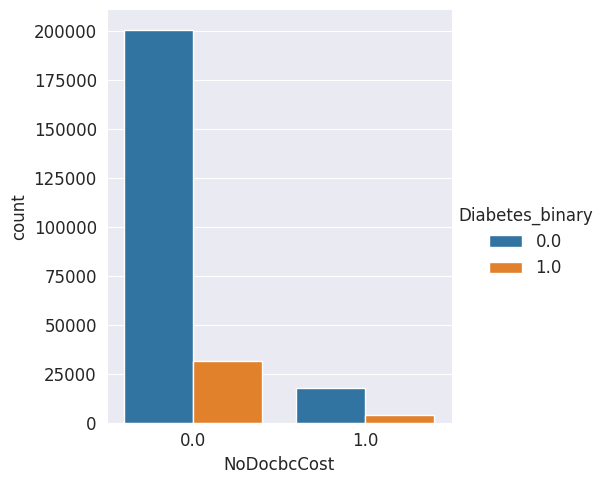

In [305]:
sns.catplot(raw_df,x='NoDocbcCost',hue='Diabetes_binary',kind='count')

From above plot we can say that people who didn't get Doctors care at right have more chance diabetes.

In [306]:
raw_df.columns

Index(['Diabetes_binary', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

# Training The Model :

In [307]:
!pip install scikit-learn --upgrad


Usage:   
  pip3 install [options] <requirement specifier> [package-index-options] ...
  pip3 install [options] -r <requirements file> [package-index-options] ...
  pip3 install [options] [-e] <vcs project url> ...
  pip3 install [options] [-e] <local project path> ...
  pip3 install [options] <archive url/path> ...

ambiguous option: --upgrad (--upgrade, --upgrade-strategy?)


In [308]:
from sklearn.model_selection import train_test_split

In [309]:
#Spliting The Data :
train_val_df,test_df=train_test_split(raw_df,test_size=0.2,random_state=2)
train_df,val_df=train_test_split(train_val_df,test_size=0.2,random_state=2)

In [310]:
print('train_df.shape : ',train_df.shape)
print('val_df.shape : ',val_df.shape)
print('test_df.shape : ',test_df.shape)


train_df.shape :  (162355, 22)
val_df.shape :  (40589, 22)
test_df.shape :  (50736, 22)


In [311]:
train_df

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
66859,0.0,0.0,0.0,1.0,23.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,1.0,2.0,0.0,0.0,1.0,3.0,6.0,6.0
253011,0.0,0.0,0.0,1.0,24.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,3.0,6.0,5.0
214667,0.0,0.0,0.0,1.0,21.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,1.0,2.0,0.0,0.0,0.0,2.0,5.0,8.0
209667,0.0,0.0,1.0,1.0,27.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,5.0,30.0,4.0,0.0,0.0,7.0,2.0,2.0
89401,1.0,0.0,0.0,1.0,30.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,0.0,9.0,4.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12458,0.0,1.0,0.0,1.0,36.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,4.0,0.0,30.0,1.0,0.0,13.0,5.0,3.0
95575,0.0,1.0,1.0,1.0,24.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,4.0,30.0,20.0,0.0,1.0,13.0,4.0,4.0
163917,0.0,1.0,0.0,1.0,23.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,6.0,8.0
10140,0.0,0.0,1.0,1.0,25.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,3.0,7.0,1.0,0.0,0.0,7.0,6.0,7.0


In [312]:
val_df

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
137807,0.0,0.0,0.0,1.0,31.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,2.0,1.0,5.0,1.0,0.0,1.0,5.0,4.0
19880,0.0,0.0,0.0,0.0,30.0,1.0,0.0,0.0,1.0,1.0,...,0.0,0.0,2.0,7.0,0.0,0.0,0.0,3.0,5.0,7.0
159003,0.0,1.0,1.0,1.0,40.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,1.0,0.0,0.0,0.0,8.0,6.0,8.0
118865,0.0,0.0,0.0,1.0,33.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,2.0,2.0,0.0,0.0,0.0,4.0,5.0,7.0
221625,0.0,1.0,0.0,1.0,22.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,12.0,4.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107061,0.0,0.0,1.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,9.0,4.0,7.0
167007,0.0,0.0,0.0,1.0,32.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,1.0,0.0,0.0,1.0,0.0,12.0,3.0,3.0
161188,0.0,0.0,0.0,1.0,25.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,9.0,5.0,8.0
36595,0.0,0.0,0.0,1.0,36.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,15.0,0.0,0.0,0.0,8.0,5.0,8.0


In [313]:
test_df

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
112062,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,10.0,6.0,8.0
7314,0.0,0.0,0.0,1.0,23.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,0.0,7.0,5.0,8.0
74632,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,0.0,4.0,6.0,8.0
152265,0.0,1.0,0.0,1.0,22.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,3.0,0.0,0.0,0.0,7.0,6.0,8.0
83939,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,7.0,6.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182460,1.0,1.0,1.0,1.0,25.0,0.0,1.0,0.0,0.0,1.0,...,1.0,0.0,5.0,20.0,5.0,0.0,0.0,13.0,3.0,6.0
58183,1.0,1.0,1.0,1.0,30.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,4.0,0.0,30.0,0.0,0.0,12.0,6.0,7.0
110062,0.0,0.0,1.0,1.0,27.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,2.0,25.0,4.0,0.0,1.0,7.0,6.0,8.0
55312,0.0,1.0,0.0,0.0,30.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,5.0,29.0,30.0,0.0,1.0,7.0,6.0,3.0


In [314]:
#Identifying Inputs And Targets :
input_cols=['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age']
target_cols='Diabetes_binary'

In [315]:
input_cols

['HighBP',
 'HighChol',
 'CholCheck',
 'BMI',
 'Smoker',
 'Stroke',
 'HeartDiseaseorAttack',
 'PhysActivity',
 'Fruits',
 'Veggies',
 'HvyAlcoholConsump',
 'AnyHealthcare',
 'NoDocbcCost',
 'GenHlth',
 'MentHlth',
 'PhysHlth',
 'DiffWalk',
 'Sex',
 'Age']

In [316]:
target_cols

'Diabetes_binary'

In [317]:
train_inputs=train_df[input_cols].copy()
train_targets=train_df[target_cols].copy()

In [318]:
val_inputs=val_df[input_cols].copy()
val_targets=val_df[target_cols].copy()

In [319]:
test_inputs=test_df[input_cols].copy()
test_targets=test_df[target_cols].copy()


## Logistic Regression :

In [320]:
from sklearn.linear_model import LogisticRegression

In [321]:
model=LogisticRegression(solver='liblinear')

In [322]:
model.fit(train_inputs,train_targets)

LogisticRegression(solver='liblinear')

In [323]:
X_train=train_inputs
X_val=val_inputs
X_test=test_inputs

In [324]:
train_preds=model.predict(X_train)

In [325]:
train_preds

array([0., 0., 0., ..., 0., 0., 0.])

In [326]:
train_targets

66859     0.0
253011    0.0
214667    0.0
209667    0.0
89401     1.0
         ... 
12458     0.0
95575     0.0
163917    0.0
10140     0.0
199187    0.0
Name: Diabetes_binary, Length: 162355, dtype: float64

In [327]:
train_probs=model.predict_proba(X_train)
train_probs

array([[0.99020111, 0.00979889],
       [0.98532841, 0.01467159],
       [0.99409704, 0.00590296],
       ...,
       [0.98029101, 0.01970899],
       [0.96485053, 0.03514947],
       [0.88954651, 0.11045349]])

In [328]:
model.classes_

array([0., 1.])

In [329]:
from sklearn.metrics import accuracy_score

In [330]:
#Checking Accuracy of Model:
accuracy_score(train_targets,train_preds)

0.8639709279048997

In [331]:
val_preds=model.predict(X_val)
val_preds


array([0., 0., 0., ..., 0., 0., 0.])

In [332]:
val_targets

137807    0.0
19880     0.0
159003    0.0
118865    0.0
221625    0.0
         ... 
107061    0.0
167007    0.0
161188    0.0
36595     0.0
7944      0.0
Name: Diabetes_binary, Length: 40589, dtype: float64

In [333]:
val_probs=model.predict_proba(X_val)
val_probs

array([[0.98066296, 0.01933704],
       [0.99725192, 0.00274808],
       [0.68264646, 0.31735354],
       ...,
       [0.96900091, 0.03099909],
       [0.97083315, 0.02916685],
       [0.95790703, 0.04209297]])

In [334]:
accuracy_score(val_targets,val_preds)

0.8628938875064672

In [335]:
test_preds=model.predict(X_test)
test_preds

array([0., 0., 0., ..., 0., 0., 0.])

In [336]:
test_targets

112062    0.0
7314      0.0
74632     0.0
152265    0.0
83939     0.0
         ... 
182460    1.0
58183     1.0
110062    0.0
55312     0.0
48555     0.0
Name: Diabetes_binary, Length: 50736, dtype: float64

In [337]:
test_probs=model.predict_proba(X_test)
test_probs

array([[0.83829228, 0.16170772],
       [0.96288254, 0.03711746],
       [0.96971835, 0.03028165],
       ...,
       [0.9428166 , 0.0571834 ],
       [0.89334563, 0.10665437],
       [0.69069516, 0.30930484]])

In [338]:
accuracy_score(test_targets,test_preds)

0.8624448123620309

## **Random Forest Model**

In [339]:
from sklearn.ensemble import RandomForestClassifier

In [340]:
model=RandomForestClassifier(n_jobs=-1,random_state=3)

In [341]:
%%time
model.fit(X_train,train_targets)

CPU times: user 28.4 s, sys: 277 ms, total: 28.7 s
Wall time: 16.4 s


RandomForestClassifier(n_jobs=-1, random_state=3)

In [342]:
model.score(X_train,train_targets)

0.9802469896215085

In [343]:
model.score(X_val,val_targets)

0.8537781172238784

In [344]:
model.score(X_test,test_targets)

0.855152160201829

**Tuning Hyperparameter**

n_estimators:

In [345]:
modelesti=RandomForestClassifier(random_state=3,n_jobs=-1,n_estimators=500)

In [346]:
modelesti.fit(X_train,train_targets)

RandomForestClassifier(n_estimators=500, n_jobs=-1, random_state=3)

In [347]:
modelesti.score(X_train,train_targets)


0.9803147423855132

In [348]:
modelesti.score(X_val,val_targets)


0.8542215871295179

In [349]:
modelesti.score(X_test,test_targets)

0.8558814254178493

Testing max_depth & leaf nodes

In [350]:
def test_params(**params):
  model=RandomForestClassifier(random_state=3,n_jobs=-1,**params).fit(X_train,train_targets)
  return model.score(X_train,train_targets),model.score(X_val,val_targets)

In [351]:
test_params(max_depth=5)

(0.8623879769640602, 0.8607997240631698)

In [352]:
test_params(max_depth=20)

(0.9494872347633273, 0.8627214269876075)

In [353]:
test_params(max_depth=25)

(0.9768100766838101, 0.8569809554312745)

In [354]:
test_params(max_leaf_nodes=30)

(0.8644575159372979, 0.8629431619404272)

In [355]:
test_params(max_leaf_nodes=50)

(0.865233593052262, 0.863977925053586)

**Creating Final Model of Random Forest**

In [356]:
model=RandomForestClassifier(n_jobs=-1,random_state=3,n_estimators=500,max_depth=15,max_leaf_nodes=50)

In [357]:
model.fit(X_train,train_targets)

RandomForestClassifier(max_depth=15, max_leaf_nodes=50, n_estimators=500,
                       n_jobs=-1, random_state=3)

In [358]:
model.score(X_train,train_targets),model.score(X_val,val_targets),model.score(X_test,test_targets)

(0.8653259831849959, 0.863879376185666, 0.8630361084831284)

## **XG Boost Model**

In [359]:
from xgboost import XGBClassifier

In [360]:
model=XGBClassifier(random_state=42,n_jobs=-1,max_depth=4)

In [361]:
%%time
model.fit(X_train,train_targets)

CPU times: user 22.4 s, sys: 74.5 ms, total: 22.5 s
Wall time: 12.8 s


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              predictor=None, random_state=42, ...)

In [362]:
preds=model.predict(X_train)
preds

array([0, 0, 0, ..., 0, 0, 0])

In [363]:
accuracy_score(train_targets,preds)

0.870111792060608

In [364]:
val_preds=model.predict(X_val)
val_preds

array([0, 0, 0, ..., 0, 0, 0])

In [365]:
accuracy_score(val_targets,val_preds)

0.8656532558082239

**Tuning Hyperparameters**

In [366]:
def test_params(**params):
  model=XGBClassifier(n_jobs=-1,random_state=42,**params)
  model.fit(X_train,train_targets)
  train_score=accuracy_score(model.predict(X_train),train_targets)
  val_score=accuracy_score(model.predict(X_val),val_targets)
  print('Train Score : {}, Validation Score : {}:'.format(train_score,val_score))

In [367]:
#Estimator
test_params(n_estimators=10)

Train Score : 0.8674386375535093, Validation Score : 0.8648402276478849:


In [368]:
test_params(n_estimators=20)

Train Score : 0.8692494841550923, Validation Score : 0.8651605114686245:


In [369]:
test_params(n_estimators=25)

Train Score : 0.869846940346771, Validation Score : 0.8652097859025845:


In [370]:
#Max_depth
test_params(max_depth=2)

Train Score : 0.8678574728219026, Validation Score : 0.8645938554780852:


In [371]:
test_params(max_depth=10)

Train Score : 0.9149887592005174, Validation Score : 0.8571041415161743:


In [372]:
test_params(max_depth=20)

Train Score : 0.9770934064241938, Validation Score : 0.8436522210451107:


In [373]:
#Learning_rate
test_params(n_estimators=20,learning_rate=0.01)

Train Score : 0.8659542360875858, Validation Score : 0.8636822784498263:


In [374]:
test_params(n_estimators=20,learning_rate=0.1)

Train Score : 0.8669027747836531, Validation Score : 0.8644706693931854:


In [375]:
test_params(n_estimators=20,learning_rate=0.6)

Train Score : 0.8707646823319269, Validation Score : 0.8645938554780852:


In [376]:
test_params(n_estimators=20,learning_rate=0.9)

Train Score : 0.8718487265560039, Validation Score : 0.8634605434970066:


In [377]:
#Booster
test_params(booster="gbtree")

Train Score : 0.8760493979243017, Validation Score : 0.8634112690630467:


In [378]:
test_params(booster="dart")

Train Score : 0.8760493979243017, Validation Score : 0.8634112690630467:


**Gradient Boosting Final Model**

In [379]:
model=XGBClassifier(n_jobs=-1,random_state=42,learning_rate=0.3,max_depth=5,max_leaves=5,n_estimators=20,max_bin=10, min_child_weight=10,booster='gbtree')

In [380]:
%%time
model.fit(X_train,train_targets)

CPU times: user 5.86 s, sys: 10 ms, total: 5.87 s
Wall time: 3.08 s


XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.3, max_bin=10,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=5,
              min_child_weight=10, missing=nan, monotone_constraints=None,
              n_estimators=20, n_jobs=-1, num_parallel_tree=None,
              predictor=None, random_state=42, ...)

In [381]:
test_preds=model.predict(X_train)
test_preds

array([0, 0, 0, ..., 0, 0, 0])

In [382]:
accuracy_score(preds,train_targets)

0.870111792060608

In [383]:
val_preds=model.predict(X_val)
val_preds

array([0, 0, 0, ..., 0, 0, 0])

In [384]:
accuracy_score(val_targets,val_preds)

0.8651112370346645

In [385]:
test_preds=model.predict(X_train)
test_preds

array([0, 0, 0, ..., 0, 0, 0])

In [388]:
accuracy_score=(test_targets,test_preds)

#All Model

In [389]:
#Logistic Model:
from sklearn.metrics import accuracy_score

LogModel=LogisticRegression(solver='liblinear')
LogModel.fit(X_train,train_targets)
Logtrain_preds=LogModel.predict(X_train)
Logval_preds=LogModel.predict(X_val)
Logtest_preds=LogModel.predict(X_test)

Logtrain_score=accuracy_score(train_targets,Logtrain_preds)
Logval_score=accuracy_score(val_targets,Logval_preds)
Logtest_score=accuracy_score(test_targets,Logtest_preds)

In [390]:
#Random Forest

ForestModel=RandomForestClassifier(n_jobs=-1,random_state=3,n_estimators=500,max_depth=15,max_leaf_nodes=50)
ForestModel.fit(X_train,train_targets)

Foresttrain_score=ForestModel.score(X_train,train_targets)
Forestval_score=ForestModel.score(X_val,val_targets)
Foresttest_score=ForestModel.score(X_test,test_targets)

In [391]:
#XGBoost Model

XGBModel=XGBClassifier(n_jobs=-1,random_state=42,learning_rate=0.3,max_depth=5,max_leaves=5,n_estimators=20,max_bin=10, min_child_weight=10,booster='gbtree')
XGBModel.fit(X_train,train_targets)

XGBtrain_score=XGBModel.score(X_train,train_targets)
XGBval_score=XGBModel.score(X_val,val_targets)
XGBtest_score=XGBModel.score(X_test,test_targets)

In [392]:
#Scores of All Models:
print('The Accuracy Score from Logistics Regression are : For Training Data Set {}, For Validation Dataset {}, For Test Dataset {}'.format(Logtrain_score,Logval_score,Logtest_score))

print('The Accuracy Score from Random Forest are : For Training Data Set {}, For Validation Dataset {}, For Test Dataset {}'.format(Foresttrain_score,Forestval_score,Foresttest_score))

print('The Accuracy Score from Gradient Boosting  are : For Training Data Set {}, For Validation Dataset {}, For Test Dataset {}'.format(XGBtrain_score,XGBval_score,XGBtest_score))


The Accuracy Score from Logistics Regression are : For Training Data Set 0.8639709279048997, For Validation Dataset 0.8628938875064672, For Test Dataset 0.8624448123620309
The Accuracy Score from Random Forest are : For Training Data Set 0.8653259831849959, For Validation Dataset 0.863879376185666, For Test Dataset 0.8630361084831284
The Accuracy Score from Gradient Boosting  are : For Training Data Set 0.8681715992731976, For Validation Dataset 0.8651112370346645, For Test Dataset 0.8653421633554084


In [393]:
#Creating A DataFrame of Model and their score
model=pd.DataFrame({'Model Name':['Logistic Regression','Random Forest','Gradient Boosting'],
                    'Trainng Score':[Logtrain_score,Foresttrain_score,XGBtrain_score],
                    'Validation Score':[Logval_score,Forestval_score,XGBval_score],
                    'Test Score':[Logtest_score,Foresttest_score,XGBtest_score]})
model

,Model Name,Trainng Score,Validation Score,Test Score
0,Logistic Regression,0.863971,0.862894,0.862445
1,Random Forest,0.865326,0.863879,0.863036
2,Gradient Boosting,0.868172,0.865111,0.865342


# Summary, References & Future Ideas :

## Summary :


In this project the following tasks are performed :



*   Dowload the Diabetes Health Indicators Dataset from kaggle and import basic liblaries like Pandas,matplotlib,seaborn,etc
*   Using opendatset liblary load the data in your notebook and start analysing the data.
*   After analysing the data clean the data set and plot useful graphs for Visulization. This will complete the EDA.
*   After the completion pf EDA, identify the target and inputs columns.
*    Later split the data into training and test set using train_test_split from sc.learn.
*After that use the suitable machine learning model such as logistic regression,Random forest,Gradient Boosting,etc to solve the problem.
* Finally, create a Dataframe of all models used, in order to compare them.



## Future Ideas :

**The Following Ideas can be implemented In Future :**



1.   Educating the people about Diabetes with the factors effecting the Disease.
2.   As Diabetes is Genetic Diease the genetic information will help the model to predict an excellent results.
3.  Upto some extent the income of the people effects their 'Living Style' which in return effects the possibility of having a disease. So Data can be collected accordingly for better predictions.
4.  One can try some other Models too in order to predict a better result.
5.  As the smoking has a great effect on diabtes. Therefore, Secondhand smokers data can also be collected for better predicton.




## References:


*   The Data set used in this project can be dowloaded from kaggle at  https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset
*   The EDA tutorial from Jovian : Data Analysis Zero to Pandas https://jovian.com/learn/data-analysis-with-python-zero-to-pandas
*   Machine learning tutorial from Jovian https://jovian.com/learn/machine-learning-with-python-zero-to-gbms/lesson/decision-trees-and-hyperparameters
*   Count Plot https://seaborn.pydata.org/generated/seaborn.countplot.html



